In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [4]:
import scanpy as sc
import os
import enlighten
import pandas as pd
import glob

import scanpy as sc 
import sys 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm import tqdm
import glob
import warnings
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
import random

warnings.filterwarnings('ignore')
sys.path.append('../../src')

from spaceoracle.oracles import BaseTravLR
from spaceoracle.plotting.cartography import Cartography

import celloracle as co
from celloracle.applications import Gradient_calculator
from celloracle.applications.scatter_to_grid import scatter_value_to_grid_value

In [167]:
adata = sc.read_h5ad('/Users/koush/Desktop/training_data/snrna_human_tonsil.h5ad')
adata.obsm['X_umap'] = pd.read_csv('umap.csv', index_col=0).values

In [168]:
adata.obs = adata.obs.join(pd.read_csv('tonsil_cell_types.csv', index_col=0))

In [180]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)

In [169]:
BaseTravLR.impute_clusterwise(
    adata, 
    annot='cell_type_2', 
    layer='normalized_count', 
    layer_added='imputed_count'
)   

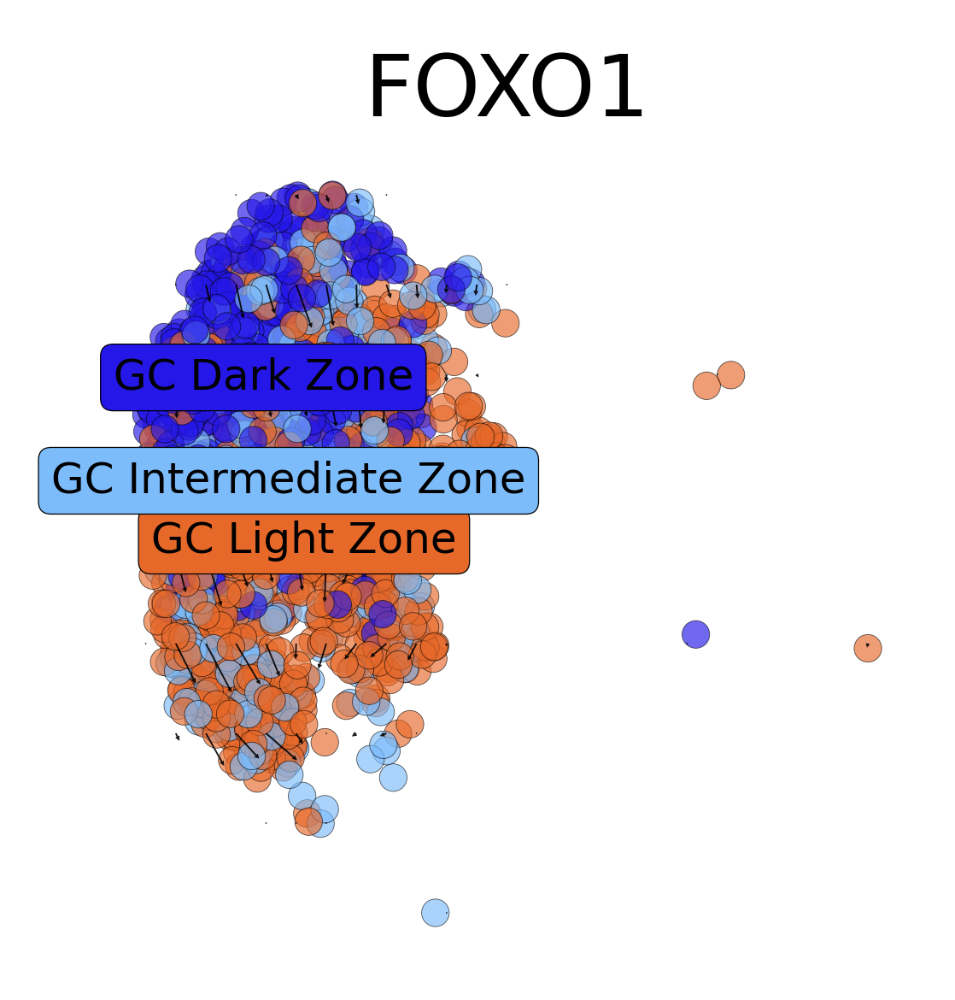

In [173]:
%matplotlib inline

color_dict = {
    'T_CD4': "#f721b7",
    'GC Dark Zone': "#2517e8",
    'GC Light Zone': "#e7692a",
    'GC Intermediate Zone':  "#7dbcfb",
    'plasma': "#61c17c",
    'B_naive': "#308f0e", 
    'B_memory': "#beb637",
    
    'Naive CD4 T': "#f721b7",
    'Treg': "#ecc91d",
    'T memory': "#49f12f",
    'Th1': "#c43cf2",
    'Th2': "#2c43f1",
    'T_CD8': "#dd3652",
    'T_follicular_helper': "#e28723",
}


perturb_target = 'FOXO1'

perturbed_df = pd.read_parquet(
    f'/Volumes/SSD/genome_screens/human_tonsil/{perturb_target}_4n_0x.parquet')

# perturbed_df.loc[~adata.obs.cell_type_2.isin(['Th2']), :] = adata.to_df(
#     layer='imputed_count').loc[~adata.obs.cell_type_2.isin(['Th2']), :]

# chart = Cartography(adata[
#     adata.obs.cell_type_2.isin(['T_follicular_helper', 'Th2', 'Th1', 'Treg', 'Naive CD4 T'])], 
# color_dict)

chart = Cartography(adata[
    adata.obs.cell_type_2.isin(['GC Light Zone', 'GC Dark Zone', 'GC Intermediate Zone'])], 
color_dict)

grid_points, vector_field, P = chart.plot_umap_quiver(
    perturb_target=perturb_target,
    grid_scale=1,
    vector_scale=0.7,
    n_neighbors=200,
    figsize=(2, 2), 
    hue='cell_type_2',
    alpha=0.65,
    perturbed_df=perturbed_df,
    scatter_size=15,
    remove_null=True,
    legend_on_loc=True,
    legend_fontsize=6,
)

plt.show()

In [174]:
adata = chart.adata

In [175]:
from spaceoracle.plotting.cartography import get_grid_layout

In [176]:
from sklearn.neighbors import KNeighborsRegressor

def _knn_regression(x, y, x_new, y_new, value, n_knn=30):

    data = np.stack([x, y], axis=1)

    model = KNeighborsRegressor(n_neighbors=n_knn)
    model.fit(data, value)

    data_new = np.stack([x_new, y_new], axis=1)

    return model.predict(data_new)

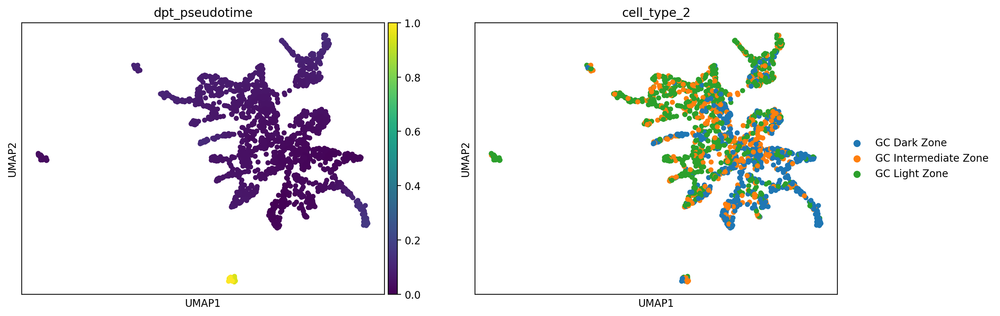

In [306]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['cell_type_2'] == 'GC Dark Zone')[1]
sc.tl.diffmap(adata)
sc.tl.dpt(adata, n_dcs=10, n_branchings=0)
sc.pl.umap(adata, color=['dpt_pseudotime', 'cell_type_2'], size=100)

In [277]:
sc.pp.neighbors(adata, n_neighbors=100, use_rep="X_diffmap")
sc.tl.umap(adata)

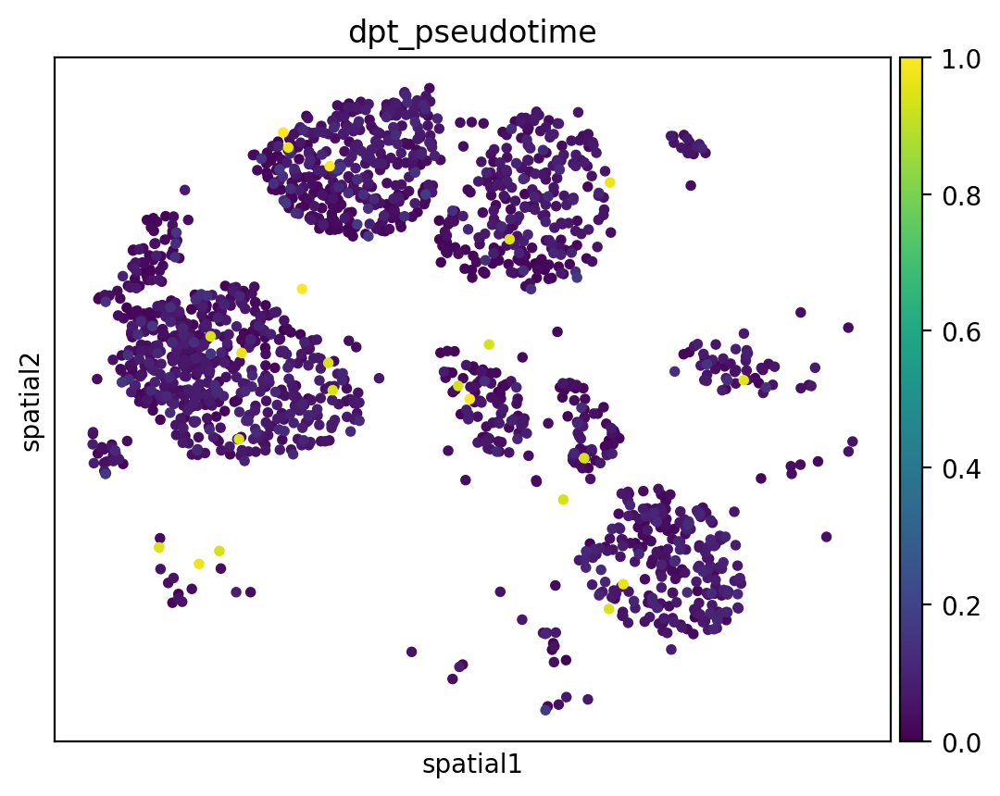

In [307]:
sc.pl.embedding(adata, color=['dpt_pseudotime'], basis='spatial')

In [279]:
from celloracle.applications.differentiation_flow import get_gradient, normalize_gradient
import random
from spaceoracle.virtual_tissue import VirtualTissue

In [280]:
embedding = adata.obsm['X_umap']
x, y = embedding[:, 0], embedding[:, 1]
x_new, y_new = grid_points[:, 0], grid_points[:, 1]
value = adata.obs.dpt_pseudotime.values
# value = tonsil.load_betadata(gene='IL21')['beta_IL7$IL7R'].values
pseudotime_on_grid = _knn_regression(x, y, x_new, y_new, value, n_knn=30)
gradient = get_gradient(value_on_grid=pseudotime_on_grid)
gradient = normalize_gradient(gradient, method="sqrt")
l2_norm = np.linalg.norm(gradient, ord=2, axis=1)
scale_factor = 1 / l2_norm.mean()
ref_flow = gradient

In [285]:
x.shape, y.shape, adata.obs.cell_type_2.values.shape

((1760,), (1760,), (1760,))

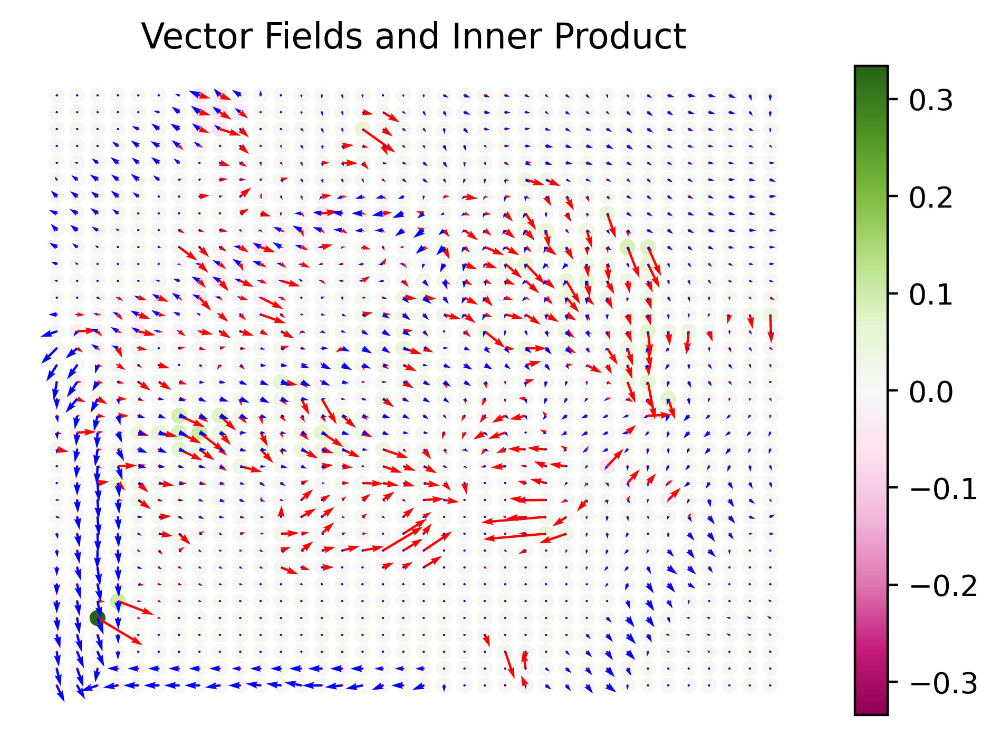

In [299]:
inner_product = np.sum(vector_field * ref_flow, axis=1)
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
vmax = np.abs(inner_product).max()
scatter = ax.scatter(grid_points[:,0], grid_points[:,1], 
                    c=inner_product, cmap='PiYG', s=20,
                    vmin=-vmax, vmax=vmax)

ax.quiver(grid_points[:,0], grid_points[:,1],
          vector_field[:,0], vector_field[:,1],
          angles='xy', scale_units='xy', scale=1,
          alpha=1, color='red', width=0.003)

ax.quiver(grid_points[:,0], grid_points[:,1],
          ref_flow[:, 0], ref_flow[:, 1], 
          angles='xy', scale_units='xy', scale=1,
          alpha=1, color='blue', width=0.003)

ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
ax.set_title('Vector Fields and Inner Product')
ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
plt.colorbar(scatter)

plt.show()

In [301]:
pseudotime_on_grid.shape, grid_points.shape

((1520,), (1520, 2))

In [317]:
tonsil = VirtualTissue(
    adata = adata,
    annot = 'cell_type_2',
    betadatas_path = '/Volumes/SSD/lasso_runs/human_tonsil',
    ko_path = '/Volumes/SSD/genome_screens/human_tonsil'
)

In [211]:
# adata = adata[adata.obs.query(
#     'cell_type_2.isin(["T_follicular_helper", "Treg", "Naive CD4 T", "Th1", "Th2"])').index]

# adata = adata[adata.obs.query(
#     'cell_type_2.isin(["GC Light Zone", "GC Dark Zone", "GC Intermediate Zone"])').index]

In [10]:
# tonsil.compute_ko_impact(force_recompute=True)

In [192]:
# %matplotlib inline
# tonsil.plot_radar(genes=[['IL7', 'IL4',  'IL6ST', 'GZMA'], ['IL21', 'PAX5', 'GATA3', 'FOXP3']], 
#     show_for=['B_germinal_center', 'B_naive', 'T_CD4', 
#     'B_memory', 'T_follicular_helper', 'T_CD8'])

In [395]:
adata.obs['cell_type_major'] = adata.obs.cell_type_2.replace(
    {
        'GC Dark Zone': 'Germinal Center B cells', 
        'GC Light Zone': 'Germinal Center B cells', 
        'GC Intermediate Zone': 'Germinal Center B cells', 
        'plasma': 'Plasma cells', 
        'B_naive': 'B cells', 
        'B_memory': 'B cells', 
        'B_germinal_center': 'Germinal Center B cells', 
        'Naive CD4 T': 'T cells', 
        'Treg': 'T cells', 
        'T memory': 'T cells', 
        'Th1': 'T cells', 
        'Th2': 'T cells', 
        'T_CD8': 'T cells', 
        'T_follicular_helper': 'T cells', 
        'mDC': 'Dendritic cells', 
        'FDC': 'Dendritic cells', 
        'myeloid': 'Myeloid cells', 
        'NK': 'NK cells', 
        'pDC': 'Dendritic cells', 
        'T_double_neg': 'T cells'
    }
)

In [396]:
color_dict = {
    'GC Dark Zone': "#f14e13",
    'GC Light Zone': "#0feca9",
    'GC Intermediate Zone':  "#4492e0",
    'plasma': "#61c17c",
    'B_naive': "#308f0e", 
    'B_memory': "#beb637",
    'B_germinal_center': "#8995cf",
    'Naive CD4 T': "#f721b7",
    'Treg': "#ecc91d",
    'T memory': "#49f12f",
    'Th1': "#c43cf2",
    'Th2': "#5e6ff3",
    'T_CD8': "#dd3652",
    'T_CD4': "#2b07f6",
    'T_follicular_helper': "#e28723",
    'mDC': "#a5a29e", 
    'FDC': "#a5a29e", 
    'myeloid': "#a5a29e", 
    'NK': "#a5a29e", 
    'pDC': "#a5a29e", 
    'T_double_neg': "#a5a29e",
    'Germinal Center B cells': "#6295cd",
    'Plasma cells': "#58a862",
    'T cells': "#cc5343",
    'B cells': "#9865c8",
    'Dendritic cells': "#9da13c",
    'Myeloid cells': "#f3c009",
    'NK cells': "#a36e29",
}

In [397]:
tonsil = VirtualTissue(
    adata = adata,
    annot = 'cell_type_2',
    betadatas_path = '/Volumes/SSD/lasso_runs/human_tonsil',
    ko_path = '/Volumes/SSD/genome_screens/human_tonsil',
    color_dict=color_dict
)

In [398]:
from spaceoracle.models.parallel_estimators import create_spatial_features

spf = create_spatial_features(
    x=adata.obsm['spatial'][:, 0], 
    y=adata.obsm['spatial'][:, 1], 
    celltypes=adata.obs.cell_type_2, 
    obs_index=adata.obs_names
)

cell_groups = {
    'GC B Cells': ['GC Light Zone', 'GC Dark Zone', 'GC Intermediate Zone'],
    'B cells': ['GC Light Zone', 'GC Dark Zone', 'GC Intermediate Zone', 'B_naive', 'B_memory'],
    # 'T cells': ['Naive CD4 T', 'T_follicular_helper', 'Th2', 'Th1', 'Treg'],
    'T cells': ['T_follicular_helper'],
    
}

In [380]:
from scipy.stats import pearsonr

from spaceoracle.plotting.cartography import xy_from_adata

xy = xy_from_adata(adata)

def plot_gene_vs_proximity(perturb_target, gene, color_gene, cell_filter, 
                          proximity_threshold=150, gene_threshold=0.005, ax=None, mode='ko'):
    perturbed_df = pd.read_parquet(
        f'/Volumes/SSD/genome_screens/human_tonsil/{perturb_target}_4n_maxx.parquet' if mode == 'maxx' else f'/Volumes/SSD/genome_screens/human_tonsil/{perturb_target}_4n_0x.parquet'
    )
    datadf = spf[
        [i+'_within' for i in cell_groups['T cells']
            ]].sum(1).to_frame().join(adata.obs.cell_type_2).query(
             f'cell_type_2.isin(["{cell_filter}"])').join(xy).join(
        ((perturbed_df-adata.to_df(layer='imputed_count'))/adata.to_df(layer='imputed_count'))*100
    )
    datadf = datadf[datadf[0] < proximity_threshold]
    
    if ax is None:
        ax = plt.gca()
    
    try:
        corr = pearsonr(datadf[datadf[gene]>gene_threshold][0], datadf[datadf[gene]>gene_threshold][gene]).statistic
        ax.set_title(f"{perturb_target} {mode.upper()} in\n{cell_filter}\nCorrelation: {corr:.4f}")
    except:
        corr = 0
        ax.set_title(f"{perturb_target} {mode.upper()} in\n{cell_filter}")
        
    scatter = ax.scatter(
        datadf[0], 
        datadf[gene], 
        c=datadf[color_gene],
        cmap='rainbow',
    )
    plt.colorbar(scatter, label=f'{color_gene} % change', shrink=0.75, ax=ax)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_ylabel(f'{gene} % change')
    # ax.set_xlabel('Number of GC B cells within 200um')
    ax.set_xlabel('Number of T cells within 200um')
    
    
    return ax, datadf

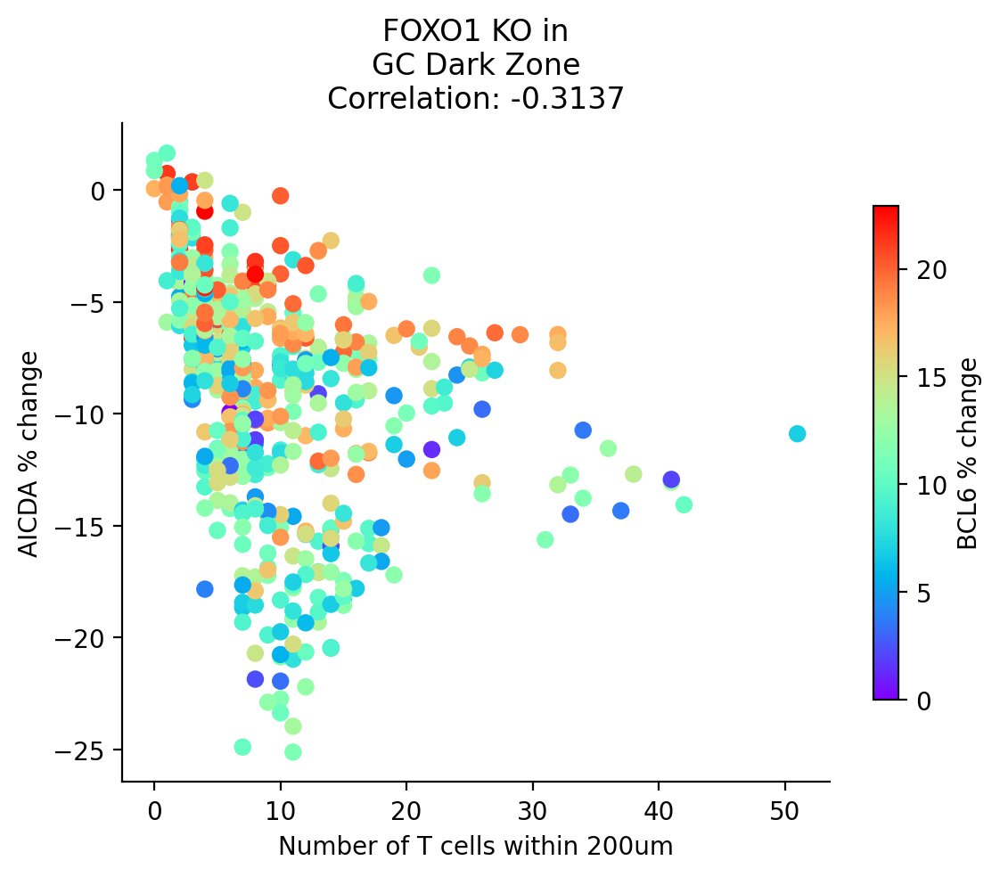

In [129]:
ax, datadf = plot_gene_vs_proximity(
    perturb_target='FOXO1', 
    gene='AICDA', 
    color_gene='BCL6', 
    # cell_filter='Naive CD4 T', 
    # cell_filter='T_follicular_helper', 
    cell_filter='GC Dark Zone', 
    # mode='maxx'
    mode='ko'
    
)
plt.show()

In [399]:
# atmp = adata[~adata.obs.index.isin(adata.obs.iloc[[2250, 2593, 3255, 5281]].index)]
# atmp = adata[pd.read_csv('GC_selection.csv', index_col=0).index]
atmp = adata
tonsil.init_cartography(atmp, 
    # restrict_to=[
    #     'Naive CD4 T',
    #     'T_follicular_helper', 
    #     'Th2', 
    #     'Th1', 
    #     'Treg',
    #     'T_CD8',
        
    #     'T memory',
         
    #     'GC Light Zone',
    #     'GC Dark Zone',
    #     'GC Intermediate Zone',
    #     'B_naive',
    #     'B_memory',
    #     'plasma'
        
    # ]
)

In [400]:
chart = Cartography(adata[
    adata.obs.cell_type_2.isin(['T_follicular_helper', 'Th2', 'Th1', 'Treg', 'Naive CD4 T'])], 
color_dict)

# chart = Cartography(adata, color_dict)

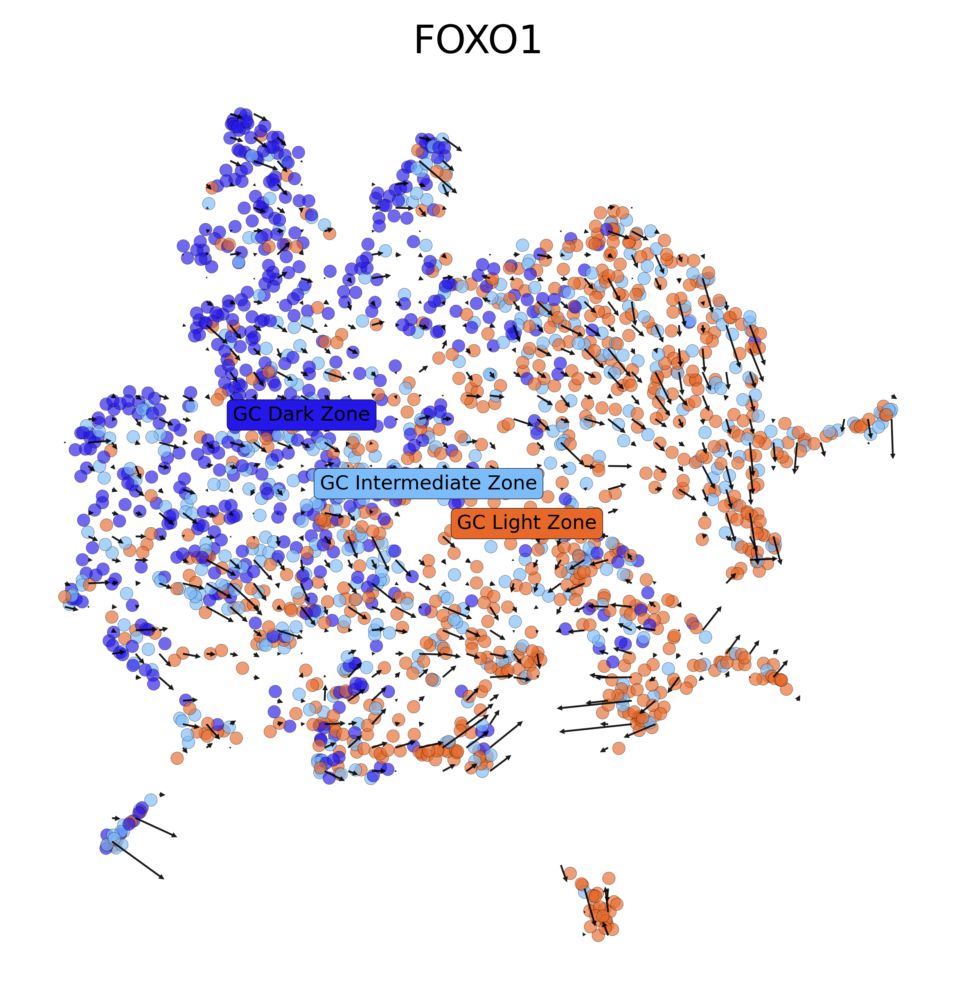

In [265]:
perturb_target = 'FOXO1'

perturbed_df = pd.read_parquet(
    f'/Volumes/SSD/genome_screens/human_tonsil/{perturb_target}_4n_0x.parquet')

# perturbed_df = pd.read_csv('celloracle_FOXO1_KO.csv', index_col=0)


# perturbed_df.loc[~adata.obs.cell_type_2.isin(['Th2']), :] = adata.to_df(
#     layer='imputed_count').loc[~adata.obs.cell_type_2.isin(['Th2']), :]

grid_points, vector_field, P = chart.plot_umap_quiver(
    perturb_target=perturb_target,
    grid_scale=1,
    vector_scale=0.8,
    n_neighbors=100,
    figsize=(5, 5), 
    hue='cell_type_2',
    alpha=0.65,
    perturbed_df=perturbed_df,
    scatter_size=15,
    remove_null=True,
    legend_on_loc=True,
    legend_fontsize=6,
)

plt.show()

In [205]:
grid_points.shape

(650, 2)

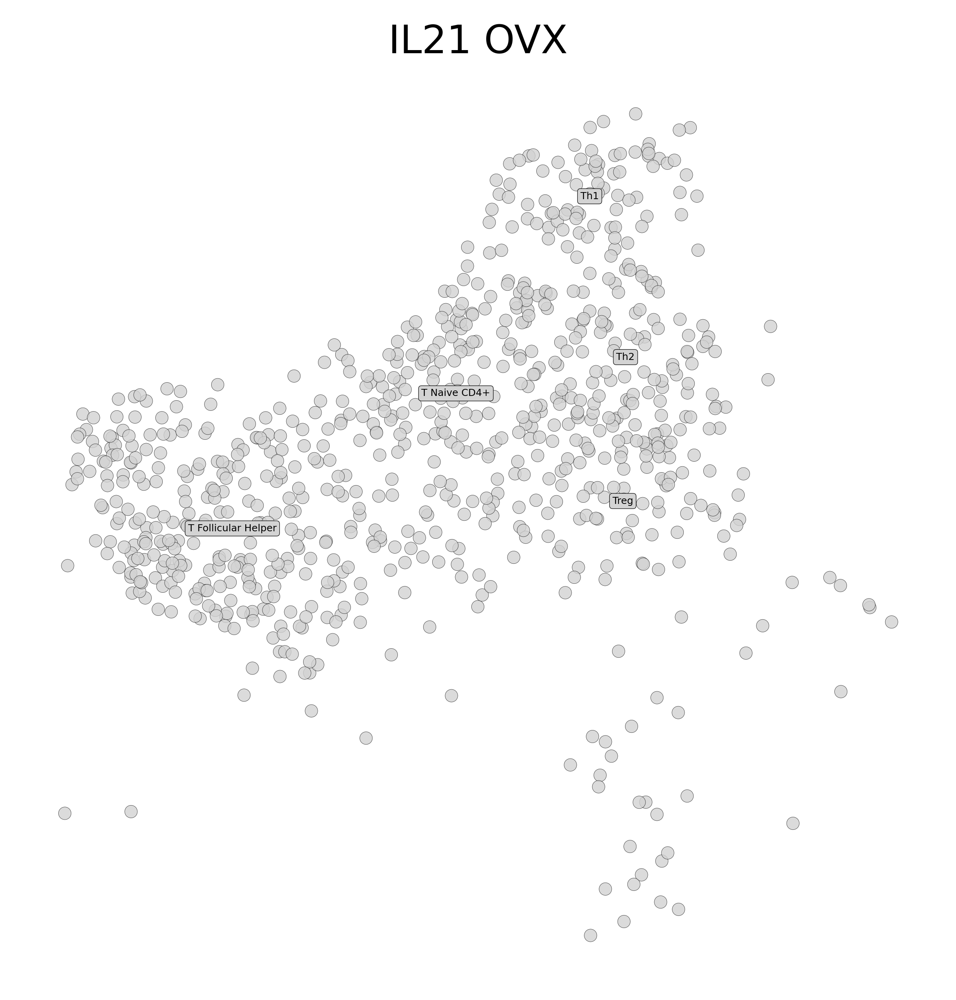

In [386]:
tonsil.plot_arrows(
    perturb_target='IL21', 
    mode='max',
    hue='cell_type_2',
    curve=True,
    vector_scale=1, 
    grid_scale=2,
    n_neighbors=200,
    scale=5, 
    grains=30,
    scatter_size=15,
    legend_fontsize=3,
    rename={
        'T_follicular_helper': 'T Follicular Helper',
        'T_CD8': 'T CD8+',
        'Naive CD4 T': 'T Naive CD4+',
    },
    highlight_clusters=[
        # 'Naive CD4 T',
        # 'T_follicular_helper', 
        # 'Th2', 
        # 'Th1', 
        # 'Treg',
        # 'T_CD8',
        'GC Light Zone',
        'GC Dark Zone',
        'GC Intermediate Zone',
        # 'B_memory',
        # 'B_naive',
        # 'plasma'
    ]
)

plt.title('IL21 OVX')
plt.show()

In [184]:
from spaceoracle.plotting.shift import estimate_transition_probabilities
kotarget = 'IL21'
embedding = adata.obsm['X_umap']
n_neighbors = 150
betadata_path = tonsil.ko_path
perturbed_df = pd.read_parquet(
    f'{betadata_path}/{kotarget}_4n_maxx.parquet')
delta_X = perturbed_df.loc[
    tonsil.chart.adata.obs_names].values - tonsil.chart.adata.layers['imputed_count']
tonsil.chart.adata.layers[kotarget] = perturbed_df.loc[tonsil.chart.adata.obs_names].values.copy()
corr = tonsil.chart.get_corr(kotarget)

In [199]:
dz = adata[adata.obs.cell_type_2 == 'GC Dark Zone'].obs_names
lz = adata[adata.obs.cell_type_2 == 'GC Light Zone'].obs_names
tfh = adata[adata.obs.cell_type_2 == 'T_follicular_helper'].obs_names
naive = adata[adata.obs.cell_type_2 == 'Naive CD4 T'].obs_names
th1 = adata[adata.obs.cell_type_2 == 'Th1'].obs_names
th2 = adata[adata.obs.cell_type_2 == 'Th2'].obs_names


In [187]:
pd.DataFrame(
    corr, 
    index=tonsil.chart.adata.obs_names, 
    columns=tonsil.chart.adata.obs_names).loc[naive, tfh].mean().mean()

0.07352654114167047

In [202]:
pd.DataFrame(
    corr, 
    index=tonsil.chart.adata.obs_names, 
    columns=tonsil.chart.adata.obs_names).loc[naive, tfh].mean().mean()

0.07352654114167047

In [191]:
pd.DataFrame(
    corr, 
    index=tonsil.chart.adata.obs_names, 
    columns=tonsil.chart.adata.obs_names).loc[dz, lz].mean().mean()

0.2270562717030147

In [203]:
pd.DataFrame(
    corr, 
    index=tonsil.chart.adata.obs_names, 
    columns=tonsil.chart.adata.obs_names).loc[dz, dz]

NAME,AAACGAATCCGTCCTA-1,AAACGAATCTTTGGAG-1,AAAGGTATCCAAACCA-1,AAAGTCCAGTTGGAGC-1,AAATGGACAGGGACTA-1,AACAAGAAGAAAGTCT-1,AACACACAGGGACACT-1,AACAGGGCATACAGCT-1,AACCAACTCTTCCTAA-1,AACCATGGTGGTATGG-1,...,TTGTTCAAGCACCAGA-1,TTGTTCAGTCTACACA-1,TTTAGTCCAGCTTCGG-1,TTTATGCGTTCTTGTT-1,TTTCATGCACGCTGAC-1,TTTGGAGAGTCCGTCG-1,TTTGGAGGTGTACGCC-1,TTTGGTTCATGTGACT-1,TTTGTTGCAGGGACTA-1,TTTGTTGGTACCACGC-1
NAME,,,,,,,,,,,,,,,,,,,,,
AAACGAATCCGTCCTA-1,1.000000,0.037751,-0.005078,-0.047830,0.001002,-0.080253,0.018081,-0.262863,-0.165916,-0.058632,...,0.312751,-0.137664,0.034499,0.065561,-0.062776,0.105238,-0.284912,-0.071313,-0.005007,-0.030195
AAACGAATCTTTGGAG-1,-0.029982,1.000000,-0.010450,-0.053143,-0.009326,-0.057789,0.006521,-0.165220,-0.108993,-0.067940,...,0.210982,-0.160563,-0.000745,0.005929,-0.054333,0.068446,-0.170334,-0.137445,-0.015732,-0.021247
AAAGGTATCCAAACCA-1,-0.006806,0.020157,1.000000,-0.058565,0.003772,-0.048185,0.036614,-0.218081,-0.119747,-0.079521,...,0.262837,-0.168274,0.017194,0.040639,-0.043232,0.103127,-0.204629,-0.074853,-0.006741,-0.045144
AAAGTCCAGTTGGAGC-1,0.047735,0.091136,0.053392,1.000000,0.082718,-0.019232,0.095862,-0.194746,-0.100032,-0.022999,...,0.279024,-0.128246,0.054128,0.096747,-0.013037,0.174799,-0.215576,-0.011165,0.059091,0.019234
AAATGGACAGGGACTA-1,-0.008127,0.027052,-0.003854,-0.097792,1.000000,-0.063526,0.088054,-0.253314,-0.168054,-0.166508,...,0.278044,-0.221358,0.016347,0.056138,-0.061385,0.147637,-0.277064,-0.074935,-0.009159,-0.057686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGAGTCCGTCG-1,-0.136445,-0.123537,-0.146539,-0.224787,-0.178086,-0.157331,-0.139699,-0.328596,-0.251130,-0.275919,...,0.262744,-0.335883,-0.081308,-0.076600,-0.157988,1.000000,-0.348625,-0.192041,-0.171602,-0.161508
TTTGGAGGTGTACGCC-1,0.351860,0.300317,0.251205,0.273463,0.321105,0.253276,0.319081,-0.136829,0.205806,0.284618,...,0.394932,0.141016,0.252337,0.420298,0.321118,0.375626,1.000000,0.148384,0.295820,0.207440
TTTGGTTCATGTGACT-1,0.062486,0.184517,0.050166,0.010569,0.050520,-0.004234,0.057786,-0.153978,-0.058324,-0.000270,...,0.304012,-0.093014,0.068346,0.080969,0.001326,0.137057,-0.129181,1.000000,0.050198,0.018418


In [141]:
corr_null = tonsil.chart.compute_perturbation_corr(
    tonsil.chart.adata.to_df(layer='imputed_count'), 
    delta_X*0
)

In [142]:
source_ct = 'GC Dark Zone'
# transition_df = chart.compute_transitions(corr, source_ct=source_ct, annot='cell_type')
n_cells = tonsil.chart.adata.shape[0]
P = np.ones((n_cells, n_cells))
T = 0.05
np.fill_diagonal(P, 0)
P *= np.exp(corr / T)   
P /= P.sum(1)[:, None]

P_null = np.ones((n_cells, n_cells))
np.fill_diagonal(P_null, 0)
P_null *= np.exp(corr_null / T)   
P_null /= P_null.sum(1)[:, None]
P = P - P_null

In [145]:
pd.DataFrame(P[tonsil.chart.adata.obs['cell_type_2'] == source_ct])

,0,1,2,3,4,5,6,7,8,9,...,4957,4958,4959,4960,4961,4962,4963,4964,4965,4966
0,-0.000201,-0.000200,-0.000130,-0.000201,-0.000201,0.002284,-0.000201,-0.000201,-0.000201,0.000000,...,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201
1,-0.000201,-0.000198,-0.000120,-0.000200,-0.000200,0.001958,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000198,-0.000201,-0.000200,-0.000200,-0.000200,-0.000199,-0.000200,-0.000201,-0.000201,-0.000201
2,-0.000201,-0.000198,-0.000101,-0.000199,-0.000199,0.001875,-0.000200,-0.000201,-0.000201,-0.000201,...,-0.000198,-0.000201,-0.000200,-0.000200,-0.000199,-0.000200,-0.000200,-0.000201,-0.000201,-0.000201
3,-0.000201,-0.000199,-0.000119,-0.000200,-0.000200,0.002251,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000199,-0.000201,-0.000201,-0.000200,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201,-0.000201
4,-0.000201,-0.000199,-0.000101,-0.000200,-0.000200,0.002184,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000199,-0.000201,-0.000201,-0.000200,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201,-0.000201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553,-0.000201,-0.000199,-0.000074,-0.000200,-0.000200,0.001744,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000199,-0.000201,-0.000200,-0.000200,-0.000200,-0.000201,-0.000200,-0.000201,-0.000201,-0.000201
554,-0.000201,-0.000200,-0.000143,-0.000201,-0.000201,0.002685,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201,-0.000197,-0.000201,-0.000201,-0.000201,-0.000201
555,-0.000201,-0.000198,-0.000081,-0.000200,-0.000200,0.001479,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000198,0.000000,-0.000201,-0.000200,-0.000200,-0.000191,-0.000201,-0.000200,-0.000201,-0.000201
556,-0.000201,-0.000199,-0.000153,-0.000199,-0.000199,0.002409,-0.000200,-0.000201,-0.000201,-0.000201,...,-0.000198,-0.000201,-0.000201,-0.000200,-0.000199,0.000000,-0.000201,-0.000201,-0.000201,-0.000201


In [204]:
transition_df

GC Dark Zone,AAACCCAAGCGCCTTG-1,AAACCCAAGTGGACGT-1,AAACCCACAGAAGTGC-1,AAACCCAGTCATTGCA-1,AAACCCATCATCGCAA-1,AAACCCATCCGATCGG-1,AAACCCATCGGTTAGT-1,AAACGAATCAATCTCT-1,AAACGAATCCCTCAAC-1,AAACGAATCCGTCCTA-1,...,TTTGGTTAGTTTGAGA-1,TTTGGTTCATGTGACT-1,TTTGGTTGTACAGCGA-1,TTTGGTTGTCCACACG-1,TTTGGTTTCGGAGTAG-1,TTTGTTGCAGGGACTA-1,TTTGTTGCATTGTAGC-1,TTTGTTGGTACCACGC-1,TTTGTTGGTCTGTCCT-1,TTTGTTGTCATGCGGC-1
0,-0.000201,-0.000200,-0.000130,-0.000201,-0.000201,0.002284,-0.000201,-0.000201,-0.000201,0.000000,...,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201
1,-0.000201,-0.000198,-0.000120,-0.000200,-0.000200,0.001958,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000198,-0.000201,-0.000200,-0.000200,-0.000200,-0.000199,-0.000200,-0.000201,-0.000201,-0.000201
2,-0.000201,-0.000198,-0.000101,-0.000199,-0.000199,0.001875,-0.000200,-0.000201,-0.000201,-0.000201,...,-0.000198,-0.000201,-0.000200,-0.000200,-0.000199,-0.000200,-0.000200,-0.000201,-0.000201,-0.000201
3,-0.000201,-0.000199,-0.000119,-0.000200,-0.000200,0.002251,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000199,-0.000201,-0.000201,-0.000200,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201,-0.000201
4,-0.000201,-0.000199,-0.000101,-0.000200,-0.000200,0.002184,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000199,-0.000201,-0.000201,-0.000200,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201,-0.000201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553,-0.000201,-0.000199,-0.000074,-0.000200,-0.000200,0.001744,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000199,-0.000201,-0.000200,-0.000200,-0.000200,-0.000201,-0.000200,-0.000201,-0.000201,-0.000201
554,-0.000201,-0.000200,-0.000143,-0.000201,-0.000201,0.002685,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000200,-0.000201,-0.000201,-0.000201,-0.000201,-0.000197,-0.000201,-0.000201,-0.000201,-0.000201
555,-0.000201,-0.000198,-0.000081,-0.000200,-0.000200,0.001479,-0.000201,-0.000201,-0.000201,-0.000201,...,-0.000198,0.000000,-0.000201,-0.000200,-0.000200,-0.000191,-0.000201,-0.000200,-0.000201,-0.000201
556,-0.000201,-0.000199,-0.000153,-0.000199,-0.000199,0.002409,-0.000200,-0.000201,-0.000201,-0.000201,...,-0.000198,-0.000201,-0.000201,-0.000200,-0.000199,0.000000,-0.000201,-0.000201,-0.000201,-0.000201


In [156]:
transition_df[adata[adata.obs.cell_type_major == 'Germinal Center B cells'].obs_names]

GC Dark Zone,AAACCCACAGAAGTGC-1,AAACCCATCCGATCGG-1,AAACGAATCCGTCCTA-1,AAACGAATCTTTGGAG-1,AAACGCTCAGCTGAAG-1,AAACGCTCAGTGTACT-1,AAACGCTGTCGACGCT-1,AAAGAACAGACAGCGT-1,AAAGGGCAGCTACTGT-1,AAAGGGCGTGGCTGCT-1,...,TTTGATCTCCTGTAGA-1,TTTGATCTCTCGTCAC-1,TTTGGAGAGTCCGTCG-1,TTTGGAGCATGACTCA-1,TTTGGAGGTGTACGCC-1,TTTGGAGGTTAACCTG-1,TTTGGAGTCTTCGGTC-1,TTTGGTTCATGTGACT-1,TTTGTTGCAGGGACTA-1,TTTGTTGGTACCACGC-1
0,-0.000130,0.002284,0.000000,-0.000201,-0.000047,0.000282,0.001012,0.000417,0.000384,0.000056,...,0.000003,5.723411e-04,-0.000161,0.000141,-0.000201,0.001399,-0.000200,-0.000201,-0.000200,-0.000201
1,-0.000120,0.001958,-0.000201,0.000000,-0.000064,0.000364,0.000976,0.000830,0.000447,0.000071,...,-0.000004,7.663443e-04,-0.000081,0.000076,-0.000201,0.001213,-0.000199,-0.000201,-0.000199,-0.000201
2,-0.000101,0.001875,-0.000201,-0.000201,-0.000048,0.000403,0.001048,0.000263,0.000066,0.000015,...,-0.000091,3.253690e-04,-0.000187,0.000021,-0.000201,0.001199,-0.000197,-0.000201,-0.000200,-0.000201
3,-0.000119,0.002251,-0.000201,-0.000201,-0.000083,0.000487,0.001171,0.000084,-0.000044,-0.000029,...,-0.000130,1.673518e-05,-0.000192,0.000012,-0.000201,0.000671,-0.000197,-0.000201,-0.000201,-0.000201
4,-0.000101,0.002184,-0.000201,-0.000201,-0.000059,0.000322,0.000888,0.000159,-0.000016,0.000006,...,-0.000116,1.485022e-04,-0.000195,-0.000049,-0.000201,0.001049,-0.000197,-0.000201,-0.000201,-0.000201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553,-0.000074,0.001744,-0.000201,-0.000201,-0.000031,0.000379,0.000785,0.000165,-0.000065,0.000075,...,-0.000154,-2.438615e-07,0.000000,-0.000145,-0.000201,0.000696,-0.000195,-0.000201,-0.000201,-0.000201
554,-0.000143,0.002685,-0.000201,-0.000201,-0.000101,0.000366,0.001411,0.000125,0.000122,-0.000050,...,-0.000101,1.722969e-04,-0.000121,0.000420,0.000000,0.000594,-0.000200,-0.000201,-0.000197,-0.000201
555,-0.000081,0.001479,-0.000201,-0.000159,-0.000026,0.000349,0.000934,0.001265,0.000633,0.000210,...,0.000100,7.950485e-04,-0.000026,0.000085,-0.000201,0.001244,-0.000199,0.000000,-0.000191,-0.000200
556,-0.000153,0.002409,-0.000201,-0.000201,-0.000113,0.000577,0.001541,-0.000031,-0.000064,-0.000108,...,-0.000157,3.144790e-05,-0.000192,0.000157,-0.000201,0.000564,-0.000198,-0.000201,0.000000,-0.000201


In [146]:
transition_df = pd.DataFrame(P[tonsil.chart.adata.obs['cell_type_2'] == source_ct])
transition_df.columns = tonsil.chart.adata.obs_names
transition_df.columns.name = source_ct

tonsil.chart.assess_transitions(
    transition_df, 
    base_celltypes=tonsil.chart.adata.obs.cell_type_2, 
    source_ct=source_ct,
    annot='cell_type_2'
)

Source Cells: GC Dark Zone,min,mean,max
Transition Target,,,
GC Light Zone,0.000480,0.000689,0.001053
GC Intermediate Zone,-0.000074,0.000520,0.000836
GC Dark Zone,-0.000201,-0.000193,-0.000130
plasma,-0.000201,-0.000199,-0.000181
B_naive,-0.000201,-0.000200,-0.000180
B_memory,-0.000201,-0.000200,-0.000176
T_follicular_helper,-0.000201,-0.000201,-0.000195
T_CD8,-0.000201,-0.000201,-0.000197
Treg,-0.000201,-0.000201,-0.000198


In [834]:
thresh = 0.000275
allowed_fates = ['GC Light Zone', 'GC Intermediate Zone', 'GC Dark Zone']
transitions = tonsil.chart.get_cellfate(transition_df, allowed_fates, thresh, annot='cell_type_2')

Counter({'GC Light Zone': 356, 'GC Intermediate Zone': 129, 'GC Dark Zone': 73}) 0.0002955951830630385


In [835]:
source_cells = tonsil.chart.adata.obs[tonsil.chart.adata.obs['cell_type_2'] == source_ct].index
tonsil.chart.adata.obs['transition'] = tonsil.chart.adata.obs['cell_type_2'].copy()
tonsil.chart.adata.obs.loc[source_cells, 'transition'] = np.array(transitions)

In [836]:
ct_points_wt, ct_points_ko = tonsil.chart.make_celltype_dict(annot='cell_type_2')

In [851]:
pts_wt_zone, _ = tonsil.chart.make_celltype_dict(annot='author_cell_type')

In [771]:
import scanpy as sc

In [837]:
import alphashape

In [862]:
pts = ct_points_ko

light_zone = alphashape.alphashape(pts['GC Light Zone'], alpha=0.035)
dark_zone = alphashape.alphashape(pts['GC Dark Zone'], alpha=0.035)
intermediate_zone = alphashape.alphashape(pts['GC Intermediate Zone'], alpha=0.035)

In [844]:
datadf = tonsil.chart.adata.obs[['cell_type_2', 'transition']].join(tonsil.xy)

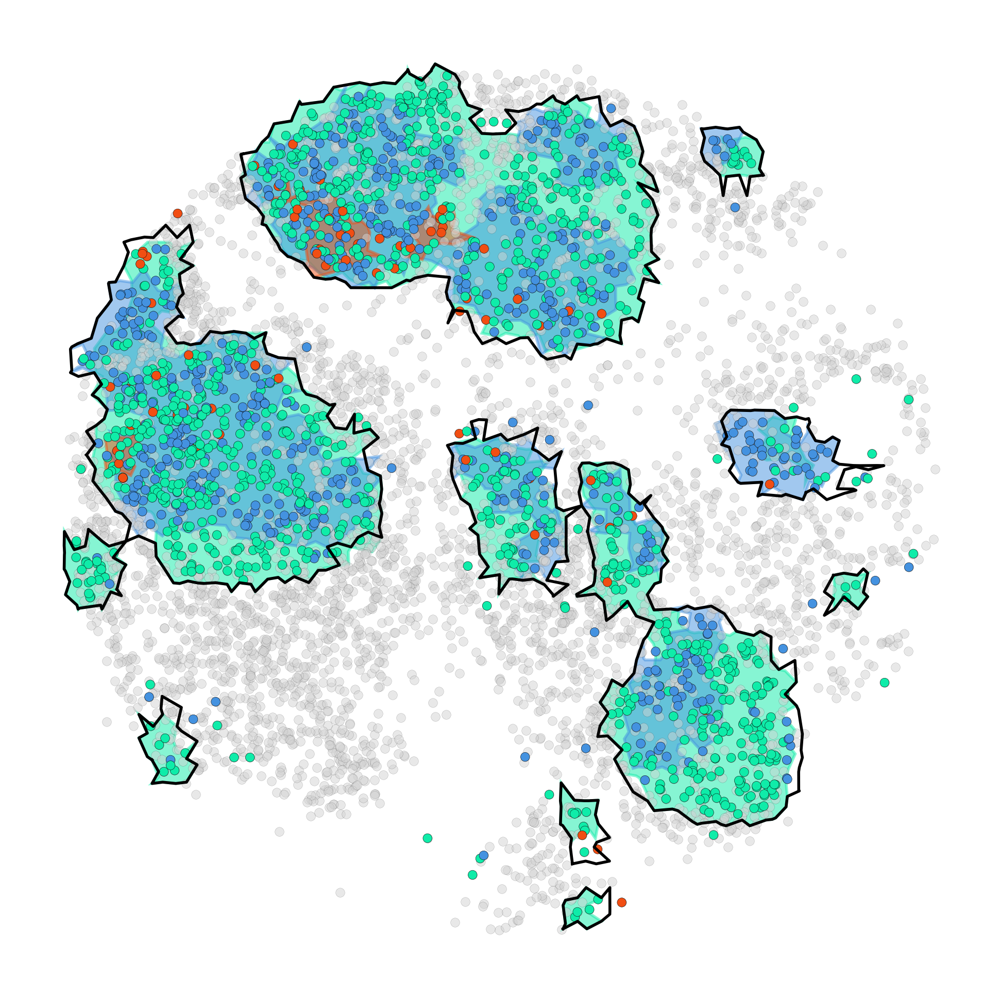

In [863]:
plt.rcParams['figure.figsize'] = (6, 6)
plt.rcParams['figure.dpi'] = 200
ax = plt.gca()
for geom in light_zone.geoms:
    if geom.area > 5000:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['GC Light Zone'], alpha=0.5)
        
for geom in intermediate_zone.geoms:
    if geom.area > 5000:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['GC Intermediate Zone'], alpha=0.5)
        
for geom in dark_zone.geoms:
    if geom.area > 5000:
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict['GC Dark Zone'], alpha=0.5)
        
        
zone = alphashape.alphashape(pts_wt_zone['B_germinal_center'], alpha=0.035)
for geom in zone.geoms:
    if geom.area > 5000:
        ax.plot(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color='black', alpha=1, linewidth=1)

sns.scatterplot(data=tonsil.xy, x='x', y='y', color='lightgrey', 
    palette=color_dict, alpha=0.5, s=10, legend=False, ax=ax, 
    linewidth=0.05, edgecolor='black'
)

sns.scatterplot(data=datadf, x='x', y='y', hue='transition', 
    palette=color_dict, alpha=1, s=10, legend=False, ax=ax, 
    linewidth=0.1, edgecolor='black'
)



ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')

plt.show()

In [780]:
import alphashape

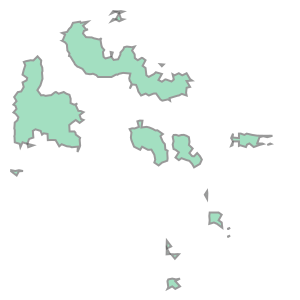

In [788]:
light_zone
dark_zone

In [619]:
import jscatter

scatter = jscatter.Scatter(
    x = adata.obsm['X_umap'][:, 0],
    y = adata.obsm['X_umap'][:, 1],
    color_by=adata.obs.cell_type_2.values
    
)

scatter.show()

In [630]:
# adata.obs.iloc[scatter.selection()].to_csv('GC_selection.csv')

In [341]:
tonsil.load_betadata('FOXO1').mean(axis=0).sort_values(ascending=False)

beta_MIF$CXCR4        1.619924
beta_KLF3             1.101234
beta_ANGPTL1$ITGB1    0.894061
beta_ANGPT2$ITGB1     0.857891
beta_TEAD2            0.765830
                        ...   
beta_MIF$CD44        -0.702046
beta_FOS             -0.754910
beta_NR4A3           -1.209975
beta_FOXP3           -1.278048
beta_NR4A2           -1.473850
Length: 998, dtype: float32

In [731]:
tonsil.init_gene_factory()

In [733]:
df = tonsil.gf.splash_betas(gene='BCL6')

In [891]:
df.var().sort_values(ascending=False)

beta_KLF2      7.866296e-01
beta_MIF       6.963449e-01
beta_ZNF219    6.507862e-01
beta_FOSL2     5.127173e-01
beta_FOXP3     4.818933e-01
                   ...     
beta_GLG1      7.837107e-22
beta_SELP      6.845857e-22
beta_CDH5      4.177488e-22
beta_NOTCH3    5.435663e-25
beta_ANGPT1    0.000000e+00
Length: 522, dtype: float64

In [901]:
ddf = df[['beta_KLF2']][tonsil.adata.obs.author_cell_type == 'B_germinal_center']
ddf[['beta_KLF2']] = ddf[['beta_KLF2']].mean()
ddf

,beta_KLF2
NAME,
AAACCCACAGAAGTGC-1,-1.912403
AAACCCATCCGATCGG-1,-1.912403
AAACGAATCCGTCCTA-1,-1.912403
AAACGAATCTTTGGAG-1,-1.912403
AAACGCTCAGCTGAAG-1,-1.912403
...,...
TTTGGAGTCTTCGGTC-1,-1.912403
TTTGGTTAGTTTGAGA-1,-1.912403
TTTGGTTCATGTGACT-1,-1.912403


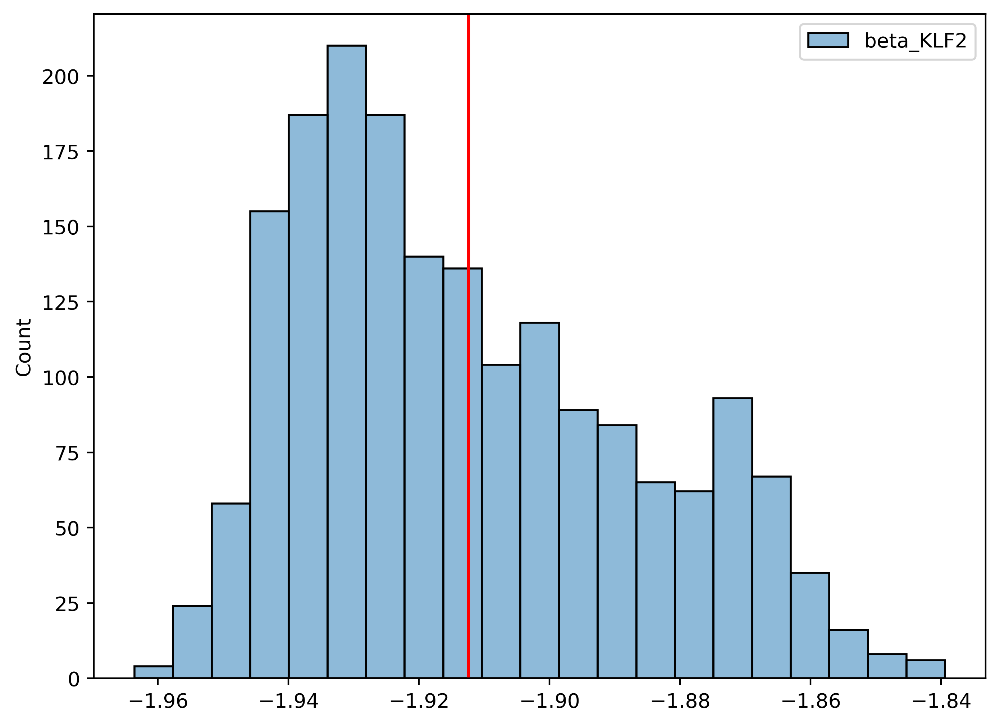

In [905]:
filtered_data = df[['beta_KLF2']][tonsil.adata.obs.author_cell_type == 'B_germinal_center']
sns.histplot(data=filtered_data)
plt.axvline(filtered_data['beta_KLF2'].mean(), color='red')


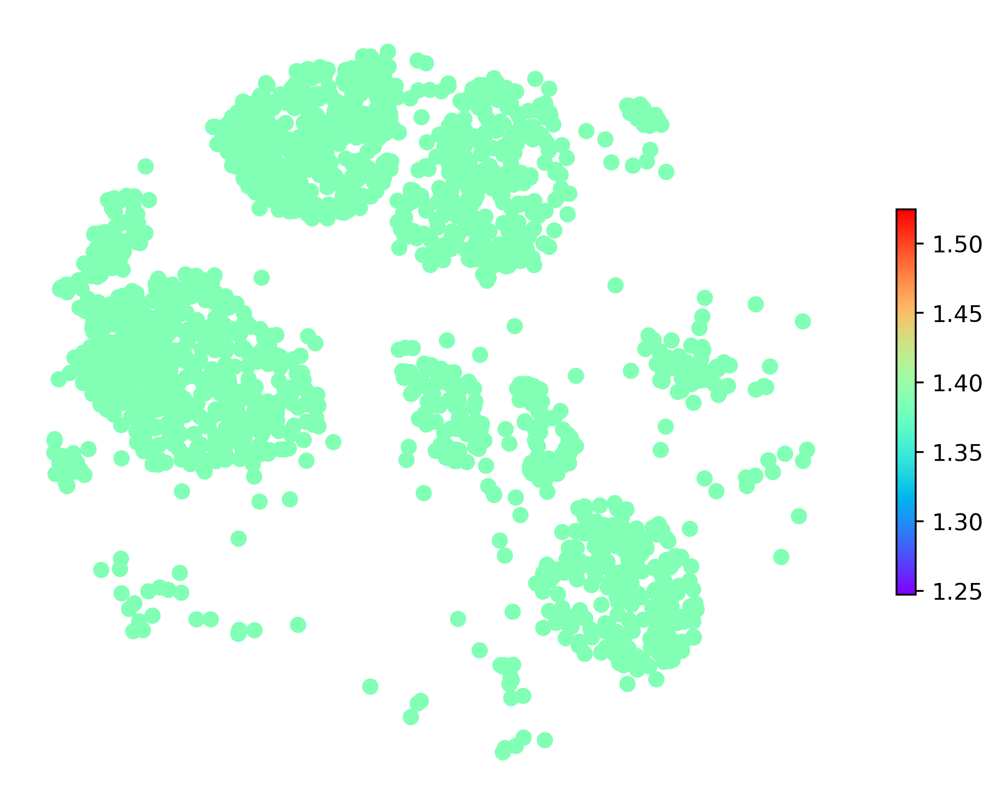

In [878]:
plt.rcParams['figure.figsize'] = (8, 6)
plot_data = df[['beta_FOSL2']].join(tonsil.xy)[tonsil.adata.obs.author_cell_type == 'B_germinal_center']
scatter = plt.scatter(
    plot_data['x'],
    plot_data['y'], 
    c=[plot_data['beta_FOSL2'].mean()]*len(plot_data),
    cmap='rainbow'
)
plt.colorbar(scatter, shrink=0.5)
plt.xlabel('')
plt.ylabel('')

plt.gca().set_frame_on(False)
plt.xticks([])
plt.yticks([])
# plt.title('Spatial FOSL2')
# plt.tight_layout()
plt.show()

In [531]:
atmp = adata[~adata.obs.index.isin(adata.obs.iloc[[2250, 2593, 3255, 5281]].index)]
chart = Cartography(atmp[
    atmp.obs.cell_type_2.isin([
        'Naive CD4 T',
        'T_follicular_helper', 
        'Th2', 
        'Th1', 
        'Treg',
        'T_CD8',
    
        # 'T memory', 
        # 'GC Dark Zone',
        # 'GC Light Zone',
        # 'GC Intermediate Zone'
    ])], 
color_dict)

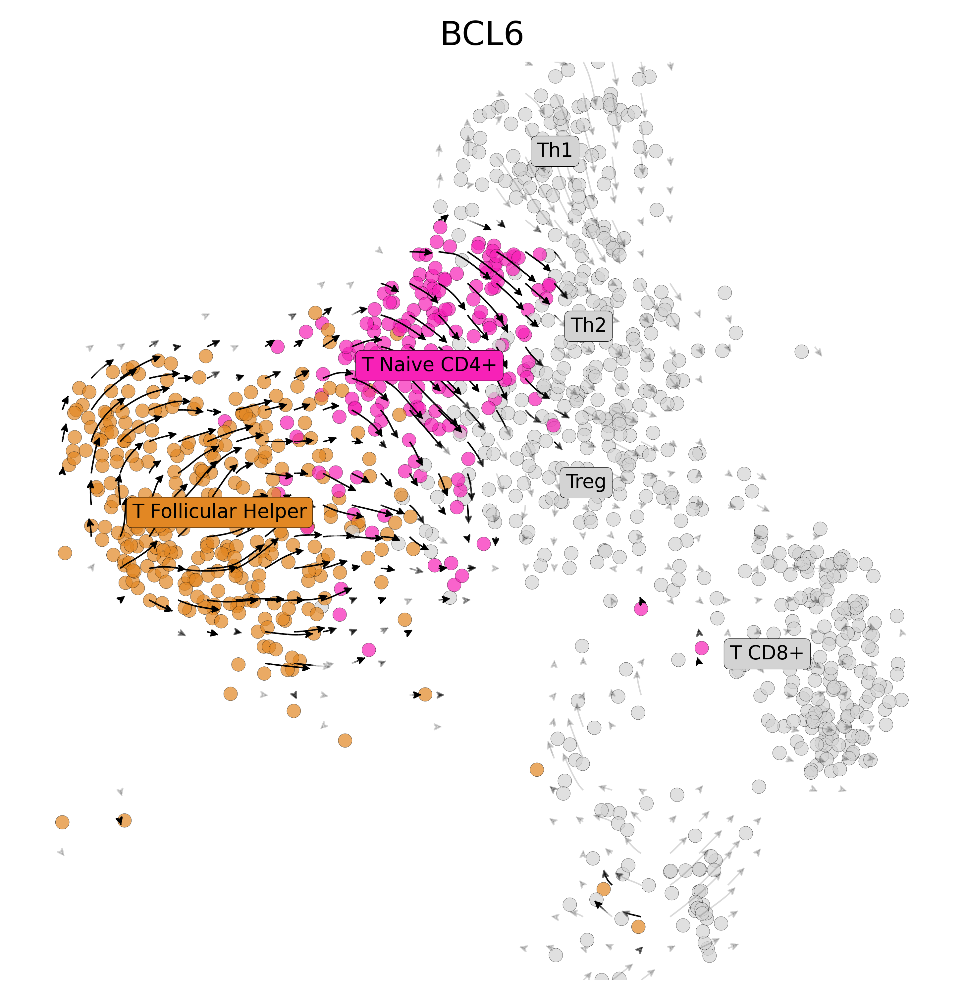

In [587]:
perturb_target = 'BCL6'

perturbed_df = pd.read_parquet(
    f'/Volumes/SSD/genome_screens/human_tonsil/{perturb_target}_4n_0x.parquet')

grid_points, vector_field = chart.plot_umap_quiver(
    perturb_target=perturb_target,
    grid_scale=1,
    dpi=300,
    vector_scale=0.85,
    n_neighbors=70,
    figsize=(6, 6), 
    hue='cell_type_2',
    alpha=0.7,
    perturbed_df=perturbed_df,
    scatter_size=25,
    remove_null=True,
    curve=True,
    legend_on_loc=True,
    legend_fontsize=7,
    scale=4,
    grains=30,
    rename={
        'T_follicular_helper': 'T Follicular Helper',
        'T_CD8': 'T CD8+',
        'Naive CD4 T': 'T Naive CD4+',
    },
    highlight_clusters=[
        'Naive CD4 T',
        'T_follicular_helper', 
        # 'Th2', 
        # 'Th1', 
        # 'Treg',
        # 'T_CD8',
    ]
)

plt.show()

In [ ]:
# Convert grid_points to 2D grid format
x = np.unique(grid_points[:, 0])
y = np.unique(grid_points[:, 1])
X, Y = np.meshgrid(x, y)

u = np.unique(vector_field[:, 0])
v = np.unique(vector_field[:, 1])
U, V = np.meshgrid(u, v)
X.shape, Y.shape, U.shape, v.shape

((31, 33), (31, 33), (430, 430), (430,))

In [ ]:
# Convert grid_points to 2D grid format
x = np.unique(grid_points[:, 0])
y = np.unique(grid_points[:, 1])
X, Y = np.meshgrid(x, y)

u = np.unique(vector_field[:, 0])
v = np.unique(vector_field[:, 1])
U, V = np.meshgrid(u, v)
X.shape, Y.shape, U.shape, v.shape

((31, 33), (31, 33), (430, 430), (430,))

In [ ]:
# Convert grid_points to 2D grid format
x = np.unique(grid_points[:, 0])
y = np.unique(grid_points[:, 1])
X, Y = np.meshgrid(x, y)

u = np.unique(vector_field[:, 0])
v = np.unique(vector_field[:, 1])
U, V = np.meshgrid(u, v)
X.shape, Y.shape, U.shape, v.shape

((31, 33), (31, 33), (430, 430), (430,))

In [ ]:
# Convert grid_points to 2D grid format
x = np.unique(grid_points[:, 0])
y = np.unique(grid_points[:, 1])
X, Y = np.meshgrid(x, y)

u = np.unique(vector_field[:, 0])
v = np.unique(vector_field[:, 1])
U, V = np.meshgrid(u, v)
X.shape, Y.shape, U.shape, v.shape

((31, 33), (31, 33), (430, 430), (430,))

In [ ]:
# Convert grid_points to 2D grid format
x = np.unique(grid_points[:, 0])
y = np.unique(grid_points[:, 1])
X, Y = np.meshgrid(x, y)

u = np.unique(vector_field[:, 0])
v = np.unique(vector_field[:, 1])
U, V = np.meshgrid(u, v)
X.shape, Y.shape, U.shape, v.shape

((31, 33), (31, 33), (430, 430), (430,))

In [ ]:
# Convert grid_points to 2D grid format
x = np.unique(grid_points[:, 0])
y = np.unique(grid_points[:, 1])
X, Y = np.meshgrid(x, y)

u = np.unique(vector_field[:, 0])
v = np.unique(vector_field[:, 1])
U, V = np.meshgrid(u, v)
X.shape, Y.shape, U.shape, v.shape

((31, 33), (31, 33), (430, 430), (430,))

In [ ]:
# Convert grid_points to 2D grid format
x = np.unique(grid_points[:, 0])
y = np.unique(grid_points[:, 1])
X, Y = np.meshgrid(x, y)

u = np.unique(vector_field[:, 0])
v = np.unique(vector_field[:, 1])
U, V = np.meshgrid(u, v)
X.shape, Y.shape, U.shape, v.shape

((31, 33), (31, 33), (430, 430), (430,))

In [ ]:
# Convert grid_points to 2D grid format
x = np.unique(grid_points[:, 0])
y = np.unique(grid_points[:, 1])
X, Y = np.meshgrid(x, y)

u = np.unique(vector_field[:, 0])
v = np.unique(vector_field[:, 1])
U, V = np.meshgrid(u, v)
X.shape, Y.shape, U.shape, v.shape

((31, 33), (31, 33), (430, 430), (430,))

In [215]:
show = [
    'GC Dark Zone', 
    'GC Light Zone', 
    'GC Intermediate Zone', 
    'plasma', 
    'B_naive', 
    'B_memory', 
    'B_germinal_center', 
    'Naive CD4 T', 
    'Treg', 
    'T memory', 
    'Th1', 
    'Th2', 'T_CD8', 
    'T_CD4'
    'T_follicular_helper', 
    # 'mDC', 
    # 'FDC', 
    # 'myeloid', 
    # 'NK', 
    # 'pDC', 
    # 'T_double_neg'
]

In [187]:
ct_points_wt = {}
for ct in adata.obs['cell_type_major'].unique():
    points = np.asarray(
        adata[adata.obs['cell_type_major'] == ct].obsm['spatial'])
    delta = 30
    points = np.vstack(
        (points +[-delta,delta], points +[-delta,-delta], 
        points +[delta,delta], points +[delta,-delta]))
    ct_points_wt[ct] = points

In [233]:
adata.obs.cell_type_2.value_counts()

cell_type_2
B_naive                 1088
GC Light Zone            735
GC Dark Zone             558
B_memory                 522
GC Intermediate Zone     467
T_follicular_helper      300
FDC                      288
plasma                   283
T memory                 264
T_CD8                    244
Treg                     198
Naive CD4 T              177
NK                       170
mDC                      137
myeloid                  102
Th1                       88
pDC                       64
Th2                       47
T_double_neg              46
Name: count, dtype: int64

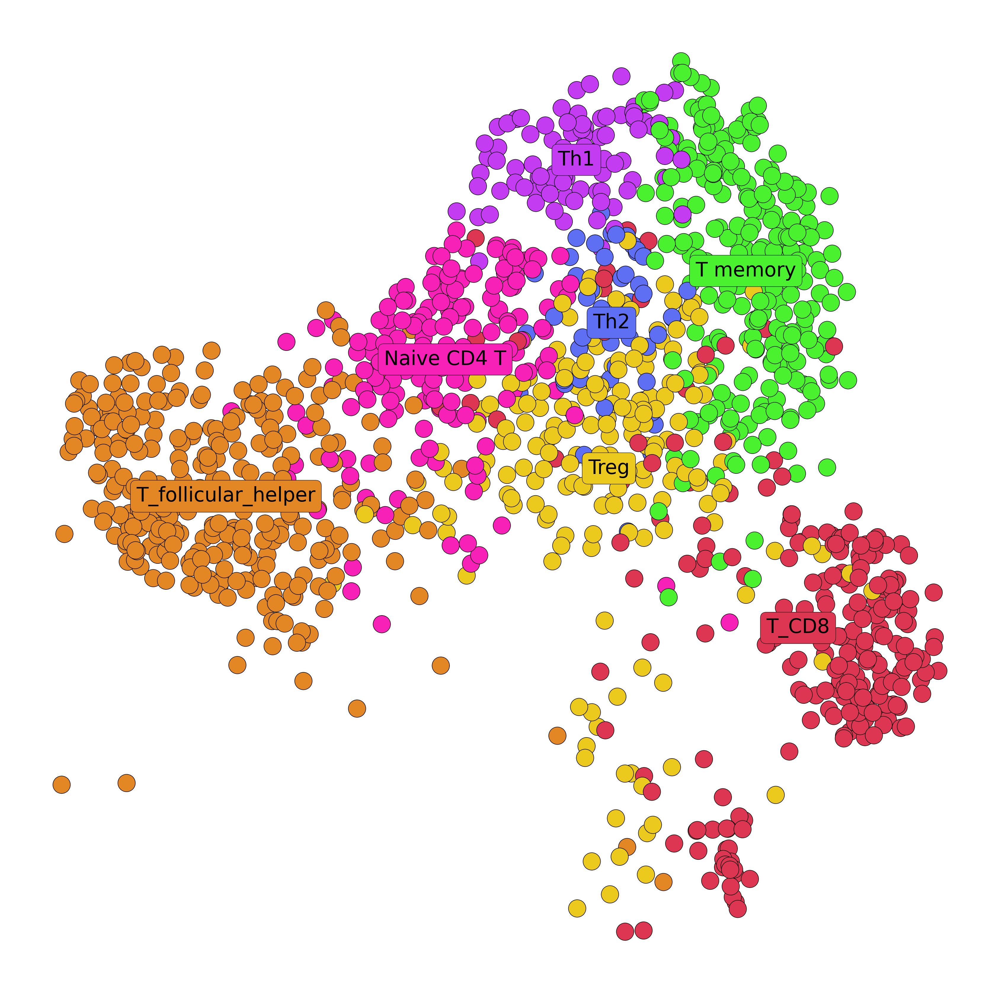

In [240]:
ax = chart.plot_umap(adata=chart.adata, 
    hue='cell_type_2', scatter_size=50, legend_on_loc=True, 
    color_dict=color_dict, basis='X_umap', alpha=1, 
    dpi=300, figsize=(7, 7), linewidth=0.2)

# alpha_shape = alphashape.alphashape(ct_points_wt['Germinal Center B cells'], alpha=0.035)

# for geom in alpha_shape.geoms:
#     # if geom.area > 10000:
#     #     ax.fill(
#     #         geom.exterior.xy[0], 
#     #         geom.exterior.xy[1], 
#     #         color='cyan', alpha=0.25)
        
#     if geom.area > 10000:
#         ax.plot(
#             geom.exterior.xy[0], 
#             geom.exterior.xy[1], 
#             color='black', alpha=1, linewidth=1.5, linestyle='--')

In [535]:
adata

AnnData object with n_obs × n_vars = 5778 × 3333
    obs: 'cell_type', 'author_cell_type', 'cell_type_int', 'banksy_celltypes', 'cell_type_2', 'cell_type_major', 'dist_to_center'
    uns: 'cell_thresholds', 'cell_type_int_colors', 'received_ligands', 'received_ligands_tfl'
    obsm: 'spatial', 'spatial_unscaled', 'X_umap'
    layers: 'imputed_count', 'normalized_count'

In [559]:
import jscatter


x = adata.obsm['spatial'][:, 0]
y = adata.obsm['spatial'][:, 1]
c = adata.obs['cell_type_2'].values

scatter = jscatter.Scatter(x, y, color_by=c, height=600, width=600, legend=True)
scatter.show()

In [539]:
scatter.selection()

array([  48,   54,   98,  200,  233,  386,  885,  892, 1531, 2220, 2532,
       2625, 2779, 3668, 3670, 3807, 3815, 4076, 4531, 4753, 5311, 5595],
      dtype=uint32)

In [543]:
scatter.selection()

array([  48,   54,   98,  200,  233,  386,  885,  892, 1531, 2220, 2532,
       2625, 2779, 3668, 3670, 3807, 3815, 4076, 4531, 4753, 5311, 5595],
      dtype=uint32)